# Answers of the Challenge:

## What is the effect of the treatment overall? Support your claim with a statistical test. 

####  In overall, the 'feed boost' treatment will bring positive effect to drive users to get their questions more answers. 

####  By Kolmogorov_Smirnov test in 0.01 significant level and its CDF&PDF plots, it indicates that: while the user's account age within or near 100 days, 'feed boost' will significantly get their questions more answers quickly since the hypothesis tests show that the distribution of number of answers in control and experimental groups are not equal, and the plots show the experimental groups converge slower than control group which mean more larger numbers occur in experimental group. After 100 days, even though the hypothesis test indicates mostly equal distribution, it demonstrates that the questions asked from control groups seem get longer time to be answered.


## How does the effect of the treatment differ given the age of a user's account? Include 1-2 visualizations that demonstrate there is/is not an effect. 

####  While the user's account age is less than or about 150 days, the 'feed boost' treatment will significantly drive users to get more number of answers because of the fat right tail in PDF of number of anwers, also it can also be visualized in the scatter plot about number of answers and age of user's account in control and experimental group. 

#### After 150 days, there is no/less effect I guess because the experimental users' questions get answered properly in a shorter time and they don't have new question yet, or maybe the questions asked from control group will take longer time to be answered. 

*** see following two visualizations

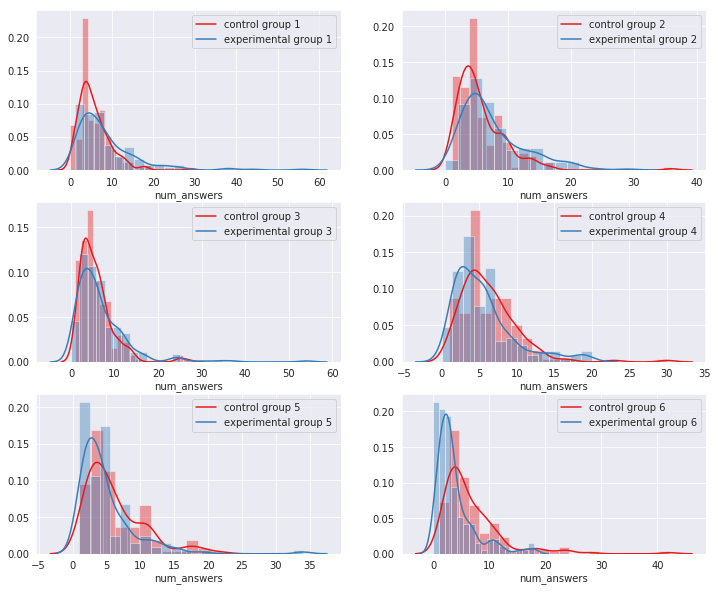

In [24]:
fig

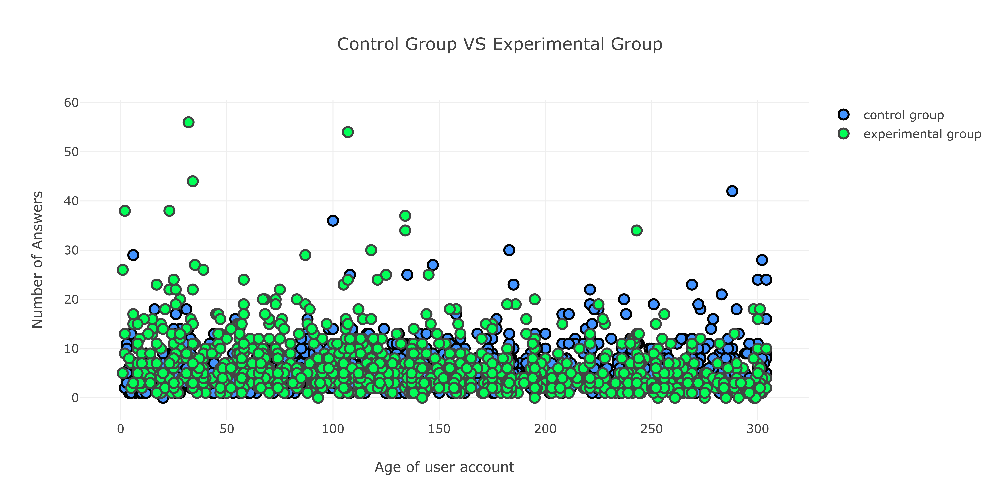

In [25]:
Image(img_bytes)

## How might the experiment introduce other positive/negative consequences into our users' behavior? Explain what metric(s) you would use to measure the impact of these additional effect(s).

#### From the purpose of exploring the total number of questions asked by each user:  By Mann-Whitney U-test of comparing the rank sum, the 'feed boost' treatment will positively drive users to ask more questions because they can get more answers quickly.

#### From the purpose of exploring the total number of answers by each user: By visualizing the proportion of total number of answers in each range of user's account age, the 'feed boost' treatment may bring negative effect to the user who don't have enough promopted automatically by Quora(similar to control group), thus, their questions will get less number of answers or take more longer to be asnwered which will drive them to leave Quora.

#### From long-term perspective, it is a challenge to get all questions prompted evenly to other users, and it need to apply some machine learning algorithms to prompted the questions which are matched other users' interests. Otherwise, users will feel annoying of the Quora prompts and un-subscribe the notification, then it will be a worst situation of less questions and less answers. 


In [1]:
# libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('darkgrid')
sns.set_palette('Set1')
%matplotlib inline

In [2]:
users = pd.read_csv('users.csv')
questions = pd.read_csv('questions.csv')

# merge users and questions datasets with unique user id, and separate into control info dataset and experiement info dataset
df = pd.merge(users, questions, on='uid')

In [3]:
users.head()

,uid,account_age,variant
0,1,204,1
1,2,258,1
2,3,161,1
3,4,253,1
4,5,112,1


In [4]:
questions.head()

,qid,uid,num_answers
0,1109,1,2.0
1,1921,2,6.0
2,1573,2,6.0
3,595,3,9.0
4,578,3,9.0


In [5]:
# geto totoal number of answers,respect to user_id
temp = df.groupby(['uid'])[["num_answers"]].sum().reset_index()
temp = temp.rename(index=str, columns={'num_answers': 'total_answers'})
temp.head()

# create new column to count total number of questions that user had asked up to date
df['total_questions'] = df['uid'].map(lambda x: df[df['uid']==x].shape[0])
df = df.merge(temp, on = 'uid', how='left')
df.head(8)

,uid,account_age,variant,qid,num_answers,total_questions,total_answers
0,1,204,1,1109,2.0,1,2.0
1,2,258,1,1921,6.0,2,12.0
2,2,258,1,1573,6.0,2,12.0
3,3,161,1,595,9.0,2,18.0
4,3,161,1,578,9.0,2,18.0
5,4,253,1,480,10.0,3,13.0
6,4,253,1,830,2.0,3,13.0
7,4,253,1,319,1.0,3,13.0


In [6]:
# separate df into control group and experimental group
con = df[df['variant']==0]
exp = df[df['variant']==1]

In [7]:
con.head()

,uid,account_age,variant,qid,num_answers,total_questions,total_answers
14,6,241,0,789,4.0,2,9.0
15,6,241,0,151,5.0,2,9.0
20,8,72,0,316,4.0,1,4.0
27,10,221,0,670,6.0,5,46.0
28,10,221,0,612,11.0,5,46.0


In [8]:
exp.head()

,uid,account_age,variant,qid,num_answers,total_questions,total_answers
0,1,204,1,1109,2.0,1,2.0
1,2,258,1,1921,6.0,2,12.0
2,2,258,1,1573,6.0,2,12.0
3,3,161,1,595,9.0,2,18.0
4,3,161,1,578,9.0,2,18.0


# Exploratory Analysis of dataset df

In [9]:
# value count and pie chart of variant column of users dataset
df['variant'].value_counts()

0    1071
1    1057
Name: variant, dtype: int64

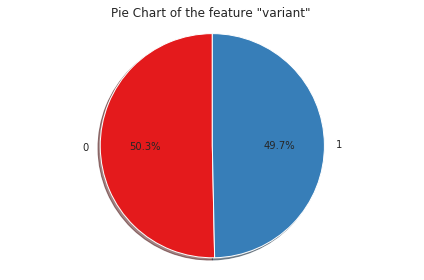

In [10]:
# pie chart of variant feature
label = df['variant'].value_counts().index.tolist()
size = df['variant'].value_counts(sort=True).tolist()

fig, ax = plt.subplots()
ax.pie(size, labels=label, autopct='%1.1f%%', shadow=True, startangle=90)

ax.axis('equal')
plt.title('variant')
plt.title('Pie Chart of the feature "variant" ')
plt.tight_layout()
plt.show()

#### ===> the variant feature is mostly uniformaly distributed in df

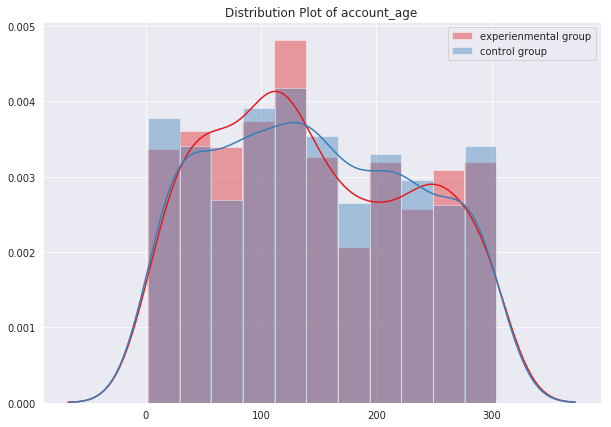

In [11]:
# distribution plot of account_age column of df dataset

plt.figure(figsize=(10,7))
sns.distplot(exp[['account_age']], fit_kws={'bw':1}, label='experienmental group')
sns.distplot(con[['account_age']], fit_kws={'bw':1}, label='control group')
plt.title('Distribution Plot of account_age')
plt.legend()
plt.show()

#### ===> Since the distribution of account age in both groups are not normal distributed, we can't perform any ANOVA test involved with account age, before the transformation to normal distribution.

In [12]:
print('The max account age of the users is:', max(df['account_age'].value_counts().index.tolist()))
print('The min account age of the users is:', min(df['account_age'].value_counts().index.tolist()))

The max account age of the users is: 304
The min account age of the users is: 1


#### ===> The age of the user's account is ranged from 1 to 304 days

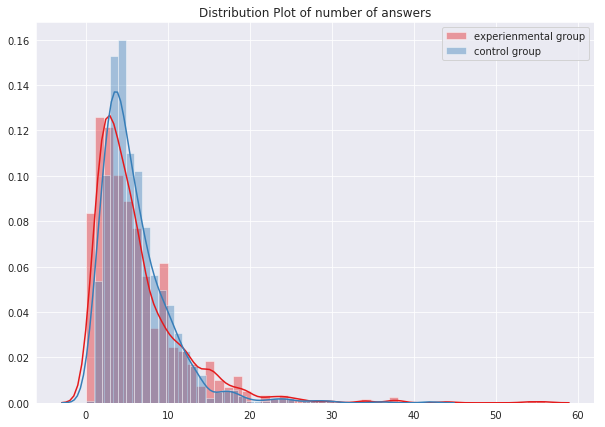

In [13]:
# distribution plot of num_answers column of questions dataset

plt.figure(figsize=(10,7))
sns.distplot(exp[['num_answers']], fit_kws={'bw':1}, label='experienmental group')
sns.distplot(con[['num_answers']], fit_kws={'bw':1}, label='control group')
plt.title('Distribution Plot of number of answers')
plt.legend()
plt.show()

#### ===> Visually, the number of answers is mainly on range [0, 20]

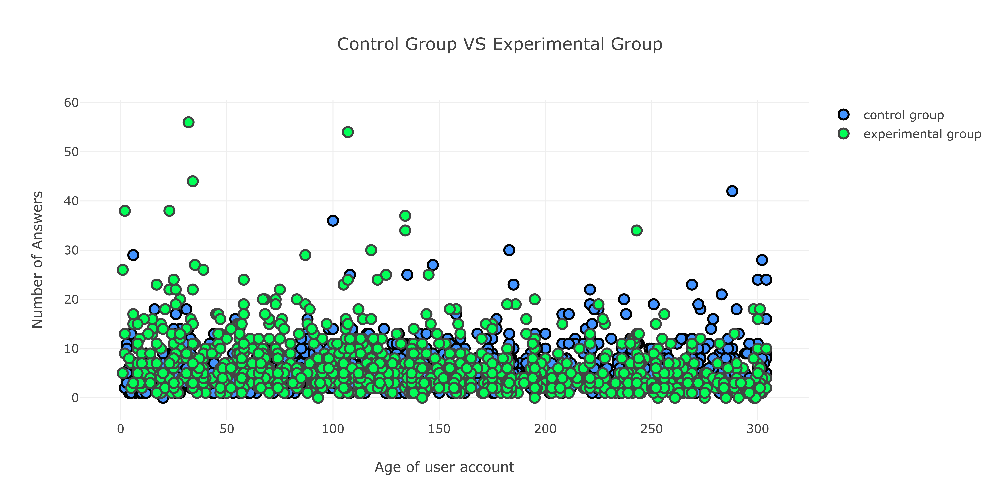

In [14]:
# scatter plot of experiemental group and control group, respect to number of answers and age of user account
import plotly.plotly as py
import plotly.graph_objs as go
import plotly.offline as offline
offline.init_notebook_mode()
import plotly.io as pio

control = go.Scatter(
    x = con.account_age,
    y = con.num_answers,
    name = 'control group',
    mode = 'markers',
    marker = dict(
        size = 10,
        color ='rgb(66, 147, 255)',
        line = dict(
            width = 2,
            color = 'rgb(0, 0, 0)'
        )
    )
)
experiment = go.Scatter(
    x = exp.account_age,
    y = exp.num_answers,
    name = 'experimental group',
    mode = 'markers',
    marker = dict(
        size = 10,
        color = 'rgb(1,255,88)',
        line = dict(
            width = 2,
        )
    )
)
data = [control, experiment]
layout = dict(title = 'Control Group VS Experimental Group',
              yaxis = dict(zeroline = False, title='Number of Answers'),
              xaxis = dict(zeroline = False, title='Age of user account')
             )
fig = dict(data=data, layout=layout)
img_bytes = pio.to_image(fig, format='png', width=1000, height=500, scale=10)
from IPython.display import Image
Image(img_bytes)

####  ===> Since the distribution of both groups are different in different range of age of user account, I decide to explore the treatment effect in 6 sub-group by given age of user account.

<font color='blue'>g1: age of user account less than 50<font color='blue'>
<font color='blue'>g2: age of user account greater than 50 and less than 100<font color='blue'>
<font color='blue'>g3: age of user account greater than 100 and less than 150<font color='blue'>
<font color='blue'>g4: age of user account greater than 150 and less than 200<font color='blue'>
<font color='blue'>g5: age of user account greater than 200 and less than 250<font color='blue'>
<font color='blue'>g6: age of user account greater than 250<font color='blue'>

In [15]:
g1 = df[df['account_age']<=50]
g2 = df[(df['account_age']>50) & (df['account_age']<=100)]
g3 = df[(df['account_age']>100) & (df['account_age']<=150)]
g4 = df[(df['account_age']>150) & (df['account_age']<=200)]
g5 = df[(df['account_age']>200) & (df['account_age']<=250)]
g6 = df[df['account_age']>250]

con1 = g1[g1['variant']==0]
exp1 = g1[g1['variant']==1]

con2 = g2[g2['variant']==0]
exp2 = g2[g2['variant']==1]

con3 = g3[g3['variant']==0]
exp3 = g3[g3['variant']==1]

con4 = g4[g4['variant']==0]
exp4 = g4[g4['variant']==1]

con5 = g5[g5['variant']==0]
exp5 = g5[g5['variant']==1]

con6 = g6[g6['variant']==0]
exp6 = g6[g6['variant']==1]

# Test Normality

In [16]:
# use Shapiro-Wilk Test to test the normality of all the data group, then decide to use
# either parametric or non-parametric statistical test further ahead
from scipy.stats import shapiro

def test_normality(data):
    alpha = 0.05

    stat, p = shapiro(data)
    
    print('Statistics=%.3f, p=%.3f' % (stat, p))

    if p > alpha:
        print('Sample looks Gaussian thus parametric (fail to reject H0)')
    else:
        print('Sample does not look Gaussian thus non-parametric (reject H0)')
    print('\n')

# test of normality
test_normality(con1['num_answers'])
test_normality(exp1['num_answers'])
test_normality(con2['num_answers'])
test_normality(exp2['num_answers'])
test_normality(con3['num_answers'])
test_normality(exp3['num_answers'])
test_normality(con4['num_answers'])
test_normality(exp4['num_answers'])
test_normality(con5['num_answers'])
test_normality(exp5['num_answers'])
test_normality(con6['num_answers'])
test_normality(exp6['num_answers'])

Statistics=0.860, p=0.000
Sample does not look Gaussian thus non-parametric (reject H0)


Statistics=0.748, p=0.000
Sample does not look Gaussian thus non-parametric (reject H0)


Statistics=0.791, p=0.000
Sample does not look Gaussian thus non-parametric (reject H0)


Statistics=0.881, p=0.000
Sample does not look Gaussian thus non-parametric (reject H0)


Statistics=0.803, p=0.000
Sample does not look Gaussian thus non-parametric (reject H0)


Statistics=0.721, p=0.000
Sample does not look Gaussian thus non-parametric (reject H0)


Statistics=0.852, p=0.000
Sample does not look Gaussian thus non-parametric (reject H0)


Statistics=0.845, p=0.000
Sample does not look Gaussian thus non-parametric (reject H0)


Statistics=0.860, p=0.000
Sample does not look Gaussian thus non-parametric (reject H0)


Statistics=0.723, p=0.000
Sample does not look Gaussian thus non-parametric (reject H0)


Statistics=0.753, p=0.000
Sample does not look Gaussian thus non-parametric (reject H0)


Statistics

#### ===> we should apply non-parametric statistical test to exam if a significant difference of distribution between experimental and control data in each group
#### ===> The proper statistical test I choose to use is 2-sample Kolmogorov_Smirnov test, for testing the equality of distributions in two independent samples. 

# Kolmogorov_Smirnov test Assumption

#### H0: The distribution of two samples are equal

#### H1: The distribution of two samples are not equal

In [17]:
from scipy.stats import ks_2samp

def Kolmogorov_Smirnov(data1, data2):
    alpha = 0.01
    statistic, p_value = ks_2samp(data1, data2)
    print('The  Kolmogorov-Smirnov test statistic is: ', statistic)
    print('The p-value is: ', p_value)
    if p_value > alpha:
        print('Fail to reject H0, thus the distribution of two samples are equal')
    else:
        print('Reject H0, thus the distribution of two samples are not equal')
    print('\n')

# test significat level of difference between 2 samples
Kolmogorov_Smirnov(con1['num_answers'], exp1['num_answers'])
Kolmogorov_Smirnov(con2['num_answers'], exp2['num_answers'])
Kolmogorov_Smirnov(con3['num_answers'], exp3['num_answers'])
Kolmogorov_Smirnov(con4['num_answers'], exp4['num_answers'])
Kolmogorov_Smirnov(con5['num_answers'], exp5['num_answers'])
Kolmogorov_Smirnov(con6['num_answers'], exp6['num_answers'])

The  Kolmogorov-Smirnov test statistic is:  0.18042048717236264
The p-value is:  0.004852974196273916
Reject H0, thus the distribution of two samples are not equal


The  Kolmogorov-Smirnov test statistic is:  0.19056771965011982
The p-value is:  0.0017065531186634582
Reject H0, thus the distribution of two samples are not equal


The  Kolmogorov-Smirnov test statistic is:  0.1172906493036715
The p-value is:  0.1038273213700862
Fail to reject H0, thus the distribution of two samples are equal


The  Kolmogorov-Smirnov test statistic is:  0.17511142387989678
The p-value is:  0.013042266075890234
Fail to reject H0, thus the distribution of two samples are equal


The  Kolmogorov-Smirnov test statistic is:  0.1688963210702341
The p-value is:  0.02691206233644416
Fail to reject H0, thus the distribution of two samples are equal


The  Kolmogorov-Smirnov test statistic is:  0.3715550386094149
The p-value is:  2.8775230117648873e-11
Reject H0, thus the distribution of two samples are not equ

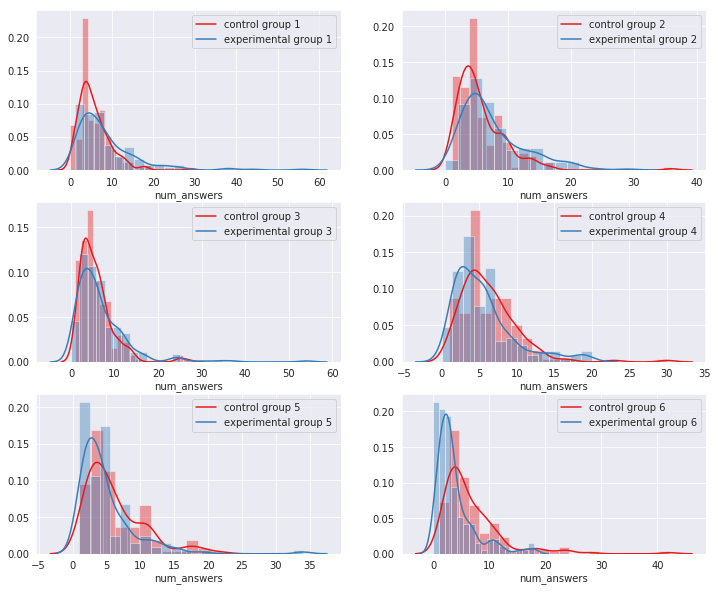

In [18]:
# PDF of num_answers

gridsize = (3, 2)
fig = plt.figure(figsize=(12, 10))
ax1 = plt.subplot2grid(gridsize, (0, 0))
ax2 = plt.subplot2grid(gridsize, (0, 1))
ax3 = plt.subplot2grid(gridsize, (1, 0))
ax4 = plt.subplot2grid(gridsize, (1, 1))
ax5 = plt.subplot2grid(gridsize, (2, 0))
ax6 = plt.subplot2grid(gridsize, (2, 1))

sns.distplot(con1['num_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=False), 
             kde_kws={"cumulative": False, "label": "control group 1"}, ax=ax1)
sns.distplot(exp1['num_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=False), 
             kde_kws={"cumulative": False, "label": "experimental group 1"}, ax=ax1)
sns.distplot(con2['num_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=False), 
             kde_kws={"cumulative": False, "label": "control group 2"}, ax=ax2)
sns.distplot(exp2['num_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=False), 
             kde_kws={"cumulative": False, "label": "experimental group 2"}, ax=ax2)
sns.distplot(con3['num_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=False), 
             kde_kws={"cumulative": False, "label": "control group 3"}, ax=ax3)
sns.distplot(exp3['num_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=False), 
             kde_kws={"cumulative": False, "label": "experimental group 3"}, ax=ax3)
sns.distplot(con4['num_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=False), 
             kde_kws={"cumulative": False, "label": "control group 4"}, ax=ax4)
sns.distplot(exp4['num_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=False), 
             kde_kws={"cumulative": False, "label": "experimental group 4"}, ax=ax4)
sns.distplot(con5['num_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=False), 
             kde_kws={"cumulative": False, "label": "control group 5"}, ax=ax5)
sns.distplot(exp5['num_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=False), 
             kde_kws={"cumulative": False, "label": "experimental group 5"}, ax=ax5)
sns.distplot(con6['num_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=False), 
             kde_kws={"cumulative": False, "label": "control group 6"}, ax=ax6)
sns.distplot(exp6['num_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=False), 
             kde_kws={"cumulative": False, "label": "experimental group 6"}, ax=ax6)

plt.show()

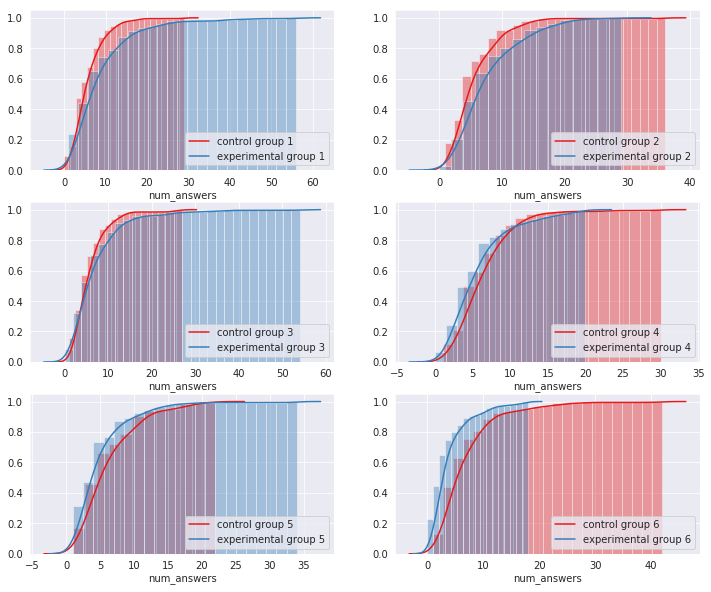

In [19]:
# CDF of num_answers

gridsize = (3, 2)
fig1 = plt.figure(figsize=(12, 10))
ax1 = plt.subplot2grid(gridsize, (0, 0))
ax2 = plt.subplot2grid(gridsize, (0, 1))
ax3 = plt.subplot2grid(gridsize, (1, 0))
ax4 = plt.subplot2grid(gridsize, (1, 1))
ax5 = plt.subplot2grid(gridsize, (2, 0))
ax6 = plt.subplot2grid(gridsize, (2, 1))

sns.distplot(con1['num_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=True), 
             kde_kws={"cumulative": True, "label": "control group 1"}, ax=ax1)
sns.distplot(exp1['num_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=True), 
             kde_kws={"cumulative": True, "label": "experimental group 1"}, ax=ax1)
sns.distplot(con2['num_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=True), 
             kde_kws={"cumulative": True, "label": "control group 2"}, ax=ax2)
sns.distplot(exp2['num_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=True), 
             kde_kws={"cumulative": True, "label": "experimental group 2"}, ax=ax2)
sns.distplot(con3['num_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=True), 
             kde_kws={"cumulative": True, "label": "control group 3"}, ax=ax3)
sns.distplot(exp3['num_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=True), 
             kde_kws={"cumulative": True, "label": "experimental group 3"}, ax=ax3)
sns.distplot(con4['num_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=True), 
             kde_kws={"cumulative": True, "label": "control group 4"}, ax=ax4)
sns.distplot(exp4['num_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=True), 
             kde_kws={"cumulative": True, "label": "experimental group 4"}, ax=ax4)
sns.distplot(con5['num_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=True), 
             kde_kws={"cumulative": True, "label": "control group 5"}, ax=ax5)
sns.distplot(exp5['num_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=True), 
             kde_kws={"cumulative": True, "label": "experimental group 5"}, ax=ax5)
sns.distplot(con6['num_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=True), 
             kde_kws={"cumulative": True, "label": "control group 6"}, ax=ax6)
sns.distplot(exp6['num_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=True), 
             kde_kws={"cumulative": True, "label": "experimental group 6"}, ax=ax6)

plt.show()

#### *** By K-S test in significant level of 0.01, and the PDF and CDF plots of group 1, 2, 3 in number of answers, the experimental groups are converging slower than the control group and with fat right tail, which means the questions asked from experimental groups will get more answers quickly than control groups for each question.

# Test users from which group more likely to ask more than one question, and how is the total number of answers look like by each user

#### ===> to validate my assumption of additional effects of the 'feed boost' treatment, I decide to use Mann-Whitney U-test, to see any location shift of the distribution within control and experimental group.

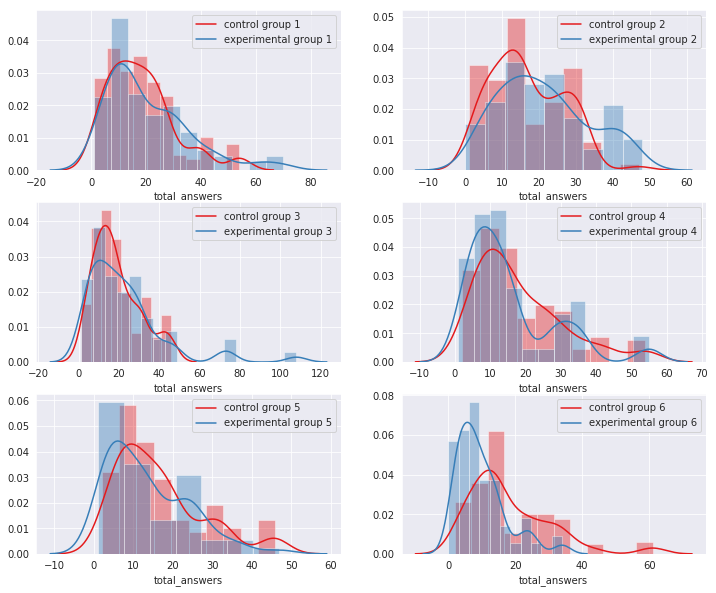

In [20]:
# pdf plots of total number of anwers, respect to each user in differnt account age

gridsize = (3, 2)
fig2 = plt.figure(figsize=(12, 10))
ax1 = plt.subplot2grid(gridsize, (0, 0))
ax2 = plt.subplot2grid(gridsize, (0, 1))
ax3 = plt.subplot2grid(gridsize, (1, 0))
ax4 = plt.subplot2grid(gridsize, (1, 1))
ax5 = plt.subplot2grid(gridsize, (2, 0))
ax6 = plt.subplot2grid(gridsize, (2, 1))

sns.distplot(con1['total_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=False), 
             kde_kws={"cumulative": False, "label": "control group 1"}, ax=ax1)
sns.distplot(exp1['total_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=False), 
             kde_kws={"cumulative": False, "label": "experimental group 1"}, ax=ax1)
sns.distplot(con2['total_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=False), 
             kde_kws={"cumulative": False, "label": "control group 2"}, ax=ax2)
sns.distplot(exp2['total_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=False), 
             kde_kws={"cumulative": False, "label": "experimental group 2"}, ax=ax2)
sns.distplot(con3['total_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=False), 
             kde_kws={"cumulative": False, "label": "control group 3"}, ax=ax3)
sns.distplot(exp3['total_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=False), 
             kde_kws={"cumulative": False, "label": "experimental group 3"}, ax=ax3)
sns.distplot(con4['total_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=False), 
             kde_kws={"cumulative": False, "label": "control group 4"}, ax=ax4)
sns.distplot(exp4['total_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=False), 
             kde_kws={"cumulative": False, "label": "experimental group 4"}, ax=ax4)
sns.distplot(con5['total_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=False), 
             kde_kws={"cumulative": False, "label": "control group 5"}, ax=ax5)
sns.distplot(exp5['total_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=False), 
             kde_kws={"cumulative": False, "label": "experimental group 5"}, ax=ax5)
sns.distplot(con6['total_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=False), 
             kde_kws={"cumulative": False, "label": "control group 6"}, ax=ax6)
sns.distplot(exp6['total_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=False), 
             kde_kws={"cumulative": False, "label": "experimental group 6"}, ax=ax6)

plt.show()

#### ===> While the user's account age is less than 150 days, the experimental groups have fat-right-tail which means more larger numbers of total answers within the rage of experimental groups. In addition, it is not sufficient to say the experimental groups get less number of answers compared with control group: maybe the users of experimental group 4, 5, 6 do not have a lot new questions to ask yet because their questions get answered properly earlier.

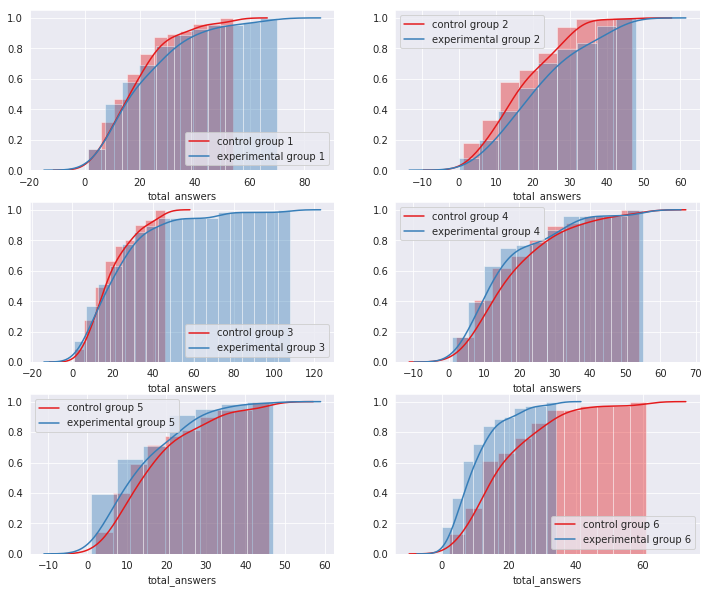

In [21]:
# CDF plots of total number of anwers, respect to each user in differnt account age

gridsize = (3, 2)
fig3 = plt.figure(figsize=(12, 10))
ax1 = plt.subplot2grid(gridsize, (0, 0))
ax2 = plt.subplot2grid(gridsize, (0, 1))
ax3 = plt.subplot2grid(gridsize, (1, 0))
ax4 = plt.subplot2grid(gridsize, (1, 1))
ax5 = plt.subplot2grid(gridsize, (2, 0))
ax6 = plt.subplot2grid(gridsize, (2, 1))

sns.distplot(con1['total_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=True), 
             kde_kws={"cumulative": True, "label": "control group 1"}, ax=ax1)
sns.distplot(exp1['total_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=True), 
             kde_kws={"cumulative": True, "label": "experimental group 1"}, ax=ax1)
sns.distplot(con2['total_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=True), 
             kde_kws={"cumulative": True, "label": "control group 2"}, ax=ax2)
sns.distplot(exp2['total_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=True), 
             kde_kws={"cumulative": True, "label": "experimental group 2"}, ax=ax2)
sns.distplot(con3['total_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=True), 
             kde_kws={"cumulative": True, "label": "control group 3"}, ax=ax3)
sns.distplot(exp3['total_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=True), 
             kde_kws={"cumulative": True, "label": "experimental group 3"}, ax=ax3)
sns.distplot(con4['total_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=True), 
             kde_kws={"cumulative": True, "label": "control group 4"}, ax=ax4)
sns.distplot(exp4['total_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=True), 
             kde_kws={"cumulative": True, "label": "experimental group 4"}, ax=ax4)
sns.distplot(con5['total_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=True), 
             kde_kws={"cumulative": True, "label": "control group 5"}, ax=ax5)
sns.distplot(exp5['total_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=True), 
             kde_kws={"cumulative": True, "label": "experimental group 5"}, ax=ax5)
sns.distplot(con6['total_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=True), 
             kde_kws={"cumulative": True, "label": "control group 6"}, ax=ax6)
sns.distplot(exp6['total_answers'], fit_kws={'bw':1}, hist_kws=dict(cumulative=True), 
             kde_kws={"cumulative": True, "label": "experimental group 6"}, ax=ax6)

plt.show()

#### ===> While the user's account age is less than or around 150 days, the users will get more number of answer in the experimental group compared to control group because control groups converge more faster in the CDF plots, and the total answers of experimental groups converge more faster after 150 days which need analyze further with other general factors.

#### *** In summary of above 2 visualizations, the treatment will drive users to get more answers quickly, and it brings significant positive effect while the user's account age is less than or about 150 days. 
#### *** Moreover, it seems that the experimental groups of users get less number of answers with account age more than 150 days, and I guess: the users of experimental group 4, 5, 6 do not have a lot new questions to ask yet because their questions get answered properly earlier, and it will take a longer time to get answers for the users in control groups.

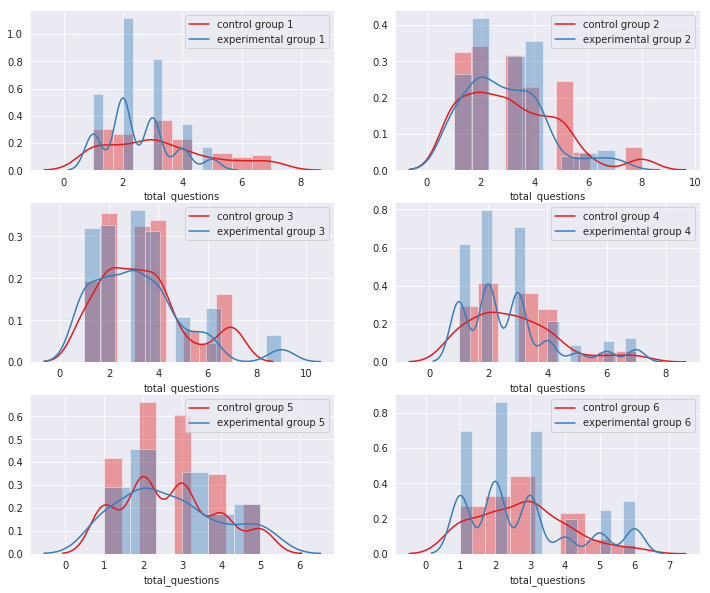

In [22]:
# pdf plots of total number of questions, respect to each user in differnt account age

gridsize = (3, 2)
fig4 = plt.figure(figsize=(12, 10))
ax1 = plt.subplot2grid(gridsize, (0, 0))
ax2 = plt.subplot2grid(gridsize, (0, 1))
ax3 = plt.subplot2grid(gridsize, (1, 0))
ax4 = plt.subplot2grid(gridsize, (1, 1))
ax5 = plt.subplot2grid(gridsize, (2, 0))
ax6 = plt.subplot2grid(gridsize, (2, 1))

sns.distplot(con1['total_questions'], fit_kws={'bw':1}, hist_kws=dict(cumulative=False), 
             kde_kws={"cumulative": False, "label": "control group 1"}, ax=ax1)
sns.distplot(exp1['total_questions'], fit_kws={'bw':1}, hist_kws=dict(cumulative=False), 
             kde_kws={"cumulative": False, "label": "experimental group 1"}, ax=ax1)
sns.distplot(con2['total_questions'], fit_kws={'bw':1}, hist_kws=dict(cumulative=False), 
             kde_kws={"cumulative": False, "label": "control group 2"}, ax=ax2)
sns.distplot(exp2['total_questions'], fit_kws={'bw':1}, hist_kws=dict(cumulative=False), 
             kde_kws={"cumulative": False, "label": "experimental group 2"}, ax=ax2)
sns.distplot(con3['total_questions'], fit_kws={'bw':1}, hist_kws=dict(cumulative=False), 
             kde_kws={"cumulative": False, "label": "control group 3"}, ax=ax3)
sns.distplot(exp3['total_questions'], fit_kws={'bw':1}, hist_kws=dict(cumulative=False), 
             kde_kws={"cumulative": False, "label": "experimental group 3"}, ax=ax3)
sns.distplot(con4['total_questions'], fit_kws={'bw':1}, hist_kws=dict(cumulative=False), 
             kde_kws={"cumulative": False, "label": "control group 4"}, ax=ax4)
sns.distplot(exp4['total_questions'], fit_kws={'bw':1}, hist_kws=dict(cumulative=False), 
             kde_kws={"cumulative": False, "label": "experimental group 4"}, ax=ax4)
sns.distplot(con5['total_questions'], fit_kws={'bw':1}, hist_kws=dict(cumulative=False), 
             kde_kws={"cumulative": False, "label": "control group 5"}, ax=ax5)
sns.distplot(exp5['total_questions'], fit_kws={'bw':1}, hist_kws=dict(cumulative=False), 
             kde_kws={"cumulative": False, "label": "experimental group 5"}, ax=ax5)
sns.distplot(con6['total_questions'], fit_kws={'bw':1}, hist_kws=dict(cumulative=False), 
             kde_kws={"cumulative": False, "label": "control group 6"}, ax=ax6)
sns.distplot(exp6['total_questions'], fit_kws={'bw':1}, hist_kws=dict(cumulative=False), 
             kde_kws={"cumulative": False, "label": "experimental group 6"}, ax=ax6)

plt.show()

#### ===> Based on the pdf plots of total questions, there is no valuable and significant pattern to indicate treatment effect.

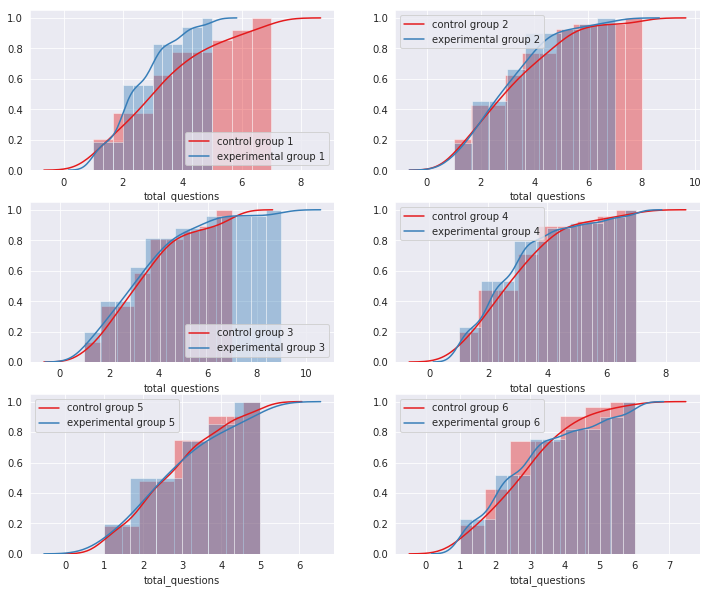

In [23]:
# cdf plots of total number of questions, respect to each user in differnt account age

gridsize = (3, 2)
fig5 = plt.figure(figsize=(12, 10))
ax1 = plt.subplot2grid(gridsize, (0, 0))
ax2 = plt.subplot2grid(gridsize, (0, 1))
ax3 = plt.subplot2grid(gridsize, (1, 0))
ax4 = plt.subplot2grid(gridsize, (1, 1))
ax5 = plt.subplot2grid(gridsize, (2, 0))
ax6 = plt.subplot2grid(gridsize, (2, 1))

sns.distplot(con1['total_questions'], fit_kws={'bw':1}, hist_kws=dict(cumulative=True), 
             kde_kws={"cumulative": True, "label": "control group 1"}, ax=ax1)
sns.distplot(exp1['total_questions'], fit_kws={'bw':1}, hist_kws=dict(cumulative=True), 
             kde_kws={"cumulative": True, "label": "experimental group 1"}, ax=ax1)
sns.distplot(con2['total_questions'], fit_kws={'bw':1}, hist_kws=dict(cumulative=True), 
             kde_kws={"cumulative": True, "label": "control group 2"}, ax=ax2)
sns.distplot(exp2['total_questions'], fit_kws={'bw':1}, hist_kws=dict(cumulative=True), 
             kde_kws={"cumulative": True, "label": "experimental group 2"}, ax=ax2)
sns.distplot(con3['total_questions'], fit_kws={'bw':1}, hist_kws=dict(cumulative=True), 
             kde_kws={"cumulative": True, "label": "control group 3"}, ax=ax3)
sns.distplot(exp3['total_questions'], fit_kws={'bw':1}, hist_kws=dict(cumulative=True), 
             kde_kws={"cumulative": True, "label": "experimental group 3"}, ax=ax3)
sns.distplot(con4['total_questions'], fit_kws={'bw':1}, hist_kws=dict(cumulative=True), 
             kde_kws={"cumulative": True, "label": "control group 4"}, ax=ax4)
sns.distplot(exp4['total_questions'], fit_kws={'bw':1}, hist_kws=dict(cumulative=True), 
             kde_kws={"cumulative": True, "label": "experimental group 4"}, ax=ax4)
sns.distplot(con5['total_questions'], fit_kws={'bw':1}, hist_kws=dict(cumulative=True), 
             kde_kws={"cumulative": True, "label": "control group 5"}, ax=ax5)
sns.distplot(exp5['total_questions'], fit_kws={'bw':1}, hist_kws=dict(cumulative=True), 
             kde_kws={"cumulative": True, "label": "experimental group 5"}, ax=ax5)
sns.distplot(con6['total_questions'], fit_kws={'bw':1}, hist_kws=dict(cumulative=True), 
             kde_kws={"cumulative": True, "label": "control group 6"}, ax=ax6)
sns.distplot(exp6['total_questions'], fit_kws={'bw':1}, hist_kws=dict(cumulative=True), 
             kde_kws={"cumulative": True, "label": "experimental group 6"}, ax=ax6)

plt.show()


#### ===> Based on the CDF plots of group 1, 2, 3, 4, it shows the total number of questions in experimental groups slightly converge more faster than control group, which means the 'feed boost' treatment slightly drives users to ask more questions.

## *** In summary of above 2 visualizations, need to use statistical test to further prove that the treatment will drive users to ask more questions in some range of user's account age because the visualization doesn't indicate the effect obviously.

# Mann-Whitney U test (two-sided)
#### Notes: The mean rank of both of these distributions can be calculated and assessed by the Mann-Whitney U test to determine whether one group has higher or lower scores than the other group.

#### H0: the distribution of total questions in control group is not equal experimental group => dist(con) == dist(exp)

#### H1: the distribution of total questions in control group is equal to experimental group => dist(con) != dist(exp)

In [23]:
import scipy

def Mann_Whitney(data1, data2):
    alpha = 0.05

    stat, p = scipy.stats.mannwhitneyu(data1, data2, alternative='two-sided')
    
    print('Statistics=%.3f, p=%.3f' % (stat, p))

    if p > alpha:
        print('(Fail to reject H0) the distribution in control group is equal to experimental group')
        print('dist(con) == dist(exp)')
    else:
        print('(Reject H0) the distribution in control group is not equal to experimental group')
        print('dist(con) != dist(exp)')
    print('\n')

Mann_Whitney(con1['total_questions'].values, exp1['total_questions'].values)
Mann_Whitney(con2['total_questions'].values, exp2['total_questions'].values)
Mann_Whitney(con3['total_questions'].values, exp3['total_questions'].values)
Mann_Whitney(con4['total_questions'].values, exp4['total_questions'].values)
Mann_Whitney(con5['total_questions'].values, exp5['total_questions'].values)
Mann_Whitney(con6['total_questions'].values, exp6['total_questions'].values)

Statistics=19835.500, p=0.000
(Reject H0) the distribution in control group is not equal to experimental group
dist(con) != dist(exp)


Statistics=18960.500, p=0.333
(Fail to reject H0) the distribution in control group is equal to experimental group
dist(con) == dist(exp)


Statistics=23593.500, p=0.228
(Fail to reject H0) the distribution in control group is equal to experimental group
dist(con) == dist(exp)


Statistics=13781.000, p=0.219
(Fail to reject H0) the distribution in control group is equal to experimental group
dist(con) == dist(exp)


Statistics=10750.500, p=0.985
(Fail to reject H0) the distribution in control group is equal to experimental group
dist(con) == dist(exp)


Statistics=16186.000, p=0.445
(Fail to reject H0) the distribution in control group is equal to experimental group
dist(con) == dist(exp)




#### *** According to the Mann-Whitney U-test, in the significant level of 0.05, it indicates that the 'feed boost' treatment brings significant effect to drive experimental group users to ask more questions in range while user's account age is about or less than 50 days, and I guess because their questions get answered more and faster and they like to use Quora. 
#### ***For users with account age more than 50 days, it seems no significant difference between control and experimental group because the users in experimental group do get their answers properly, and they don't have to ask the same/similar question again, or the users in control group have to ask similar/same questions again because they don't get answers properly.